In [ ]:
import pandas as pd
from sklearn.linear_model import LogisticRegression

# importing ploting libraries
import matplotlib.pyplot as plt

#importing seaborn for statistical plots
import seaborn as sns

#Let us break the X and y dataframes into training set and test set. For this we will use
#Sklearn package's data splitting function which is based on random function

from sklearn.model_selection import train_test_split

import numpy as np


# calculate accuracy measures and confusion matrix
from sklearn import metrics

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path_excel="/content/drive/MyDrive/haha/compactiv.xlsx"

In [ ]:
df=pd.read_excel(path_excel)

In [ ]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,0.0,4659.125,1730946.0,95.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,1.0,4659.125,1869002.0,97.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,1.0,702.000,1021237.0,87.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,1.0,4659.125,1863704.0,98.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,1.0,633.000,1760253.0,90.0


In [ ]:
df.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [ ]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [ ]:
df.shape

(8192, 22)

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


UNIVARITAE ANALYSIS - BARPLOT AND BOX PLOT

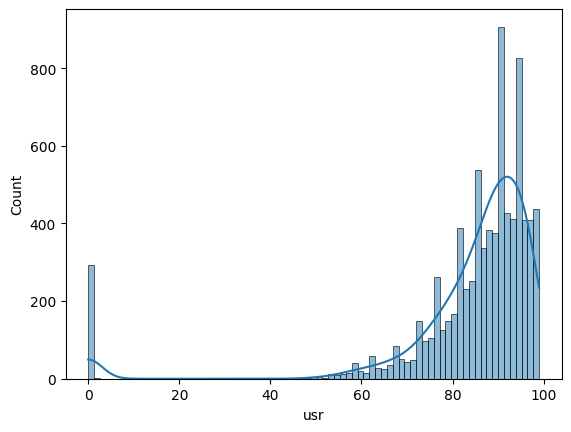

In [ ]:
sns.histplot(data=df,x='usr',kde=True);

Multi variate analysis

<ipython-input-14-35f64aa5481b>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  fig = sns.heatmap(df.iloc[:,0:19].corr(),annot=True,cbar=True,mask=np.triu(df.iloc[:,0:19].corr(),+1))


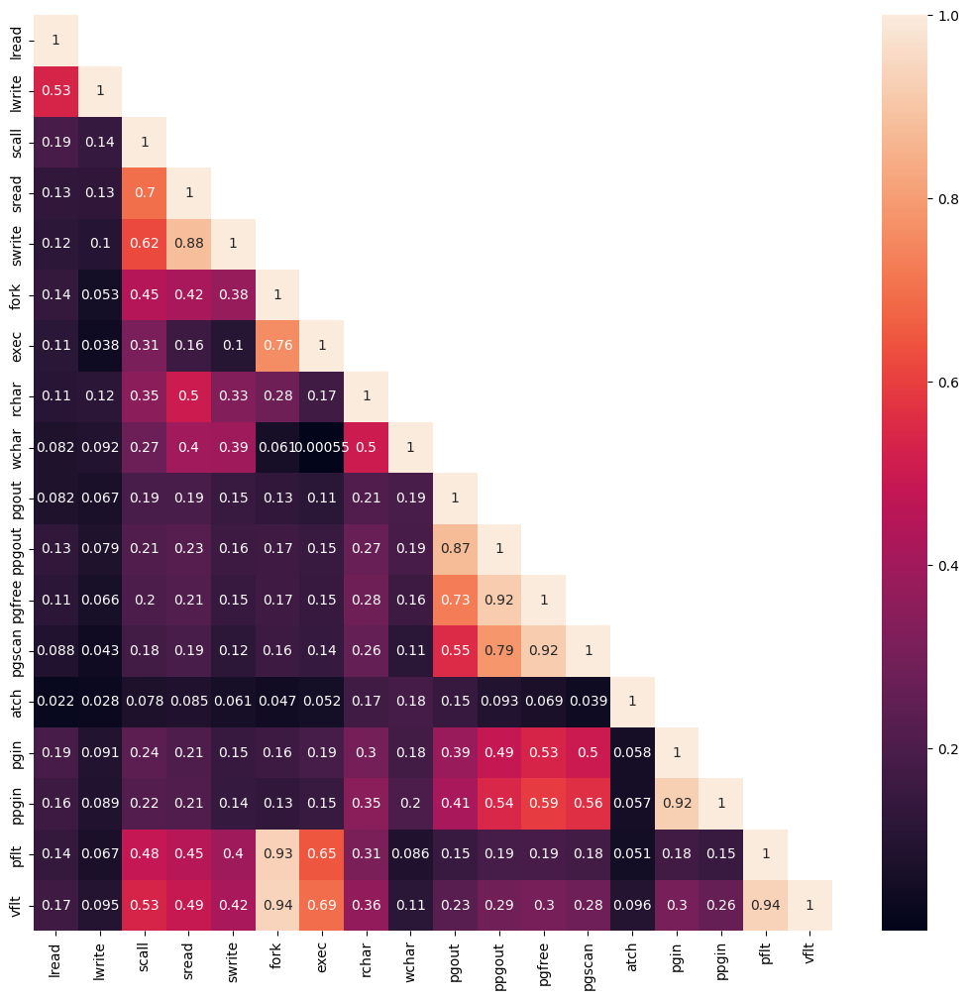

In [ ]:
plt.figure(figsize =(13,12))
fig = sns.heatmap(df.iloc[:,0:19].corr(),annot=True,cbar=True,mask=np.triu(df.iloc[:,0:19].corr(),+1))
plt.show()

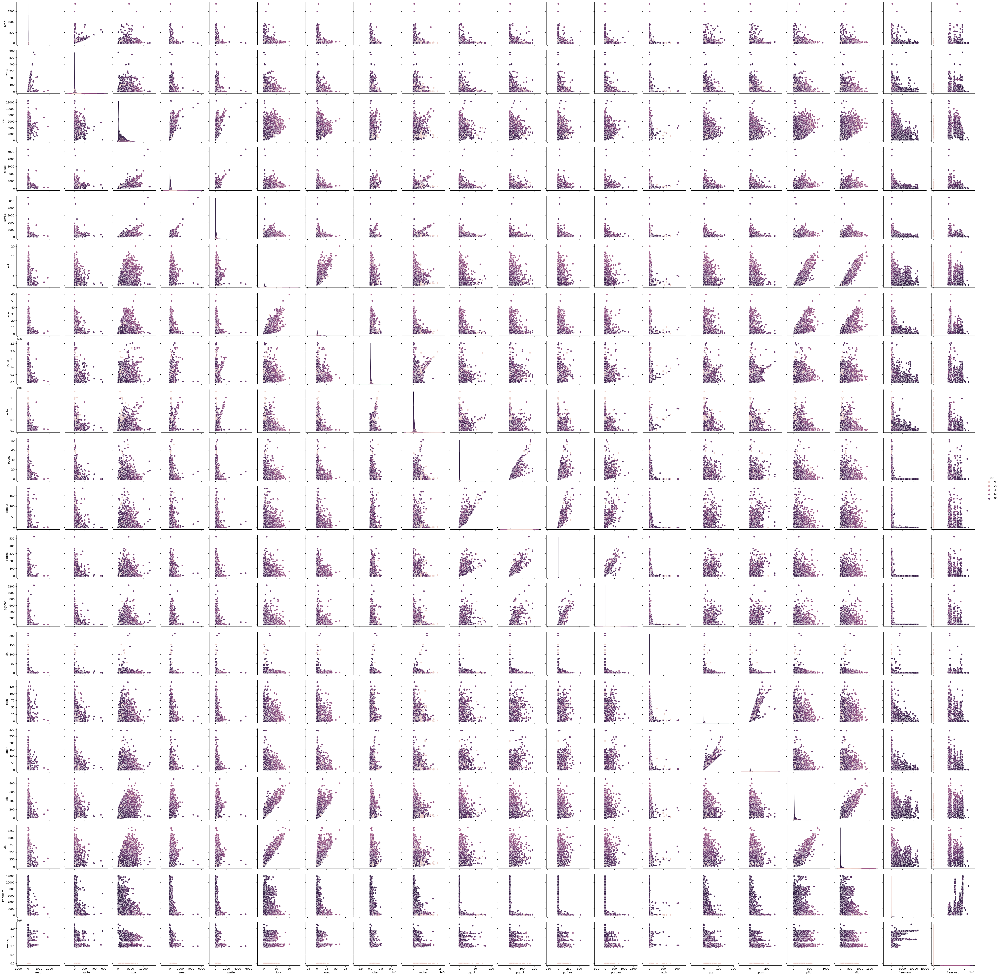

In [ ]:
# Pairplot using sns

sns.pairplot(df , hue='usr' , diag_kind = 'kde');

In [ ]:
#Check for presence of duplicate rows
df.duplicated().sum()

0

In [ ]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [ ]:
df.rchar=df.rchar.fillna(df.rchar.mean())

In [ ]:
df.wchar=df.wchar.fillna(df.wchar.mean())

In [ ]:
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [ ]:
print(df['runqsz'].value_counts())

Not_CPU_Bound    4331
CPU_Bound        3861
Name: runqsz, dtype: int64


In [ ]:
for feature in df.columns:
    if df[feature].dtype == 'object':
        print('\n')
        print('feature:',feature)
        print(pd.Categorical(df[feature].unique()))
        print(pd.Categorical(df[feature].unique()).codes)
        df[feature] = pd.Categorical(df[feature]).codes

In [ ]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,0,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,1,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,1,702,1021237,87
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,1,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,1,633,1760253,90


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8192 non-null   float64
 8   wchar     8192 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   int8   
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [ ]:
num=df.iloc[:,0:23]

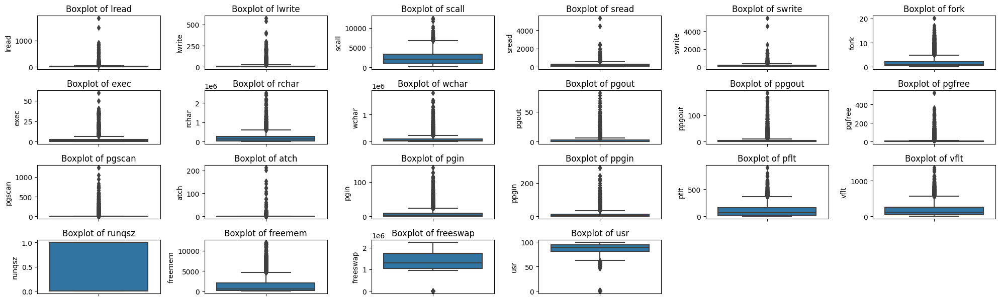

In [ ]:
plt.figure(figsize = (20,15))
feature_list = num.columns
for i in range(len(feature_list)):
    plt.subplot(10, 6, i + 1)
    sns.boxplot(y = num [feature_list[i]], data = num)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()


In [ ]:
def remove_outliers(col):
  q1,q3=col.quantile([0.25,0.75])
  IQR=q3-q1
  LL=q1-(1.5*IQR)
  UL=q3+(1.5*IQR)
  return LL, UL

In [ ]:
for i in df.columns:
  LL,UL = remove_outliers(df[i])
  df[i]=np.where(df[i]>UL, UL , df[i])
  df[i]=np.where(df[i]<LL, LL , df[i])


In [ ]:
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.20,40671.000000,53995.0,0.0,...,0.0,0.0,1.6000,2.60,16.00,26.40,0.0,4659.125,1730946.0,95.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.20,448.000000,8385.0,0.0,...,0.0,0.0,0.0000,0.00,15.63,16.83,1.0,4659.125,1869002.0,97.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.40,197385.728363,31950.0,0.0,...,0.0,1.2,6.0000,9.40,150.20,220.20,1.0,702.000,1021237.0,87.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.20,197385.728363,8670.0,0.0,...,0.0,0.0,0.2000,0.20,15.60,16.80,1.0,4659.125,1863704.0,98.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.40,197385.728363,12185.0,0.0,...,0.0,0.0,1.0000,1.20,37.80,47.60,1.0,633.000,1760253.0,90.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16.0,12.0,3009.0,360.0,244.0,1.6,5.81,405250.000000,85282.0,6.0,...,0.0,0.6,23.5125,33.60,139.28,270.74,0.0,387.000,986647.0,80.0
8188,4.0,0.0,1596.0,170.0,146.0,2.4,1.80,89489.000000,41764.0,3.8,...,0.0,0.8,3.8000,4.40,122.40,212.60,1.0,263.000,1055742.0,90.0
8189,16.0,5.0,3116.0,289.0,190.0,0.6,0.60,325948.000000,52640.0,0.4,...,0.0,0.4,23.5125,33.60,60.20,219.80,1.0,400.000,969106.0,87.0
8190,32.0,25.0,5180.0,254.0,179.0,1.2,1.20,62571.000000,29505.0,1.4,...,0.0,0.4,23.0500,24.25,93.19,202.81,0.0,141.000,1022458.0,83.0


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.342285e+01,15.159741,0.0,2.00,7.0,20.000,4.700000e+01
lwrite,8192.0,6.657471e+00,9.291945,0.0,0.00,1.0,10.000,2.500000e+01
scall,8192.0,2.294484e+03,1593.093446,109.0,1012.00,2051.5,3317.250,6.775125e+03
sread,8192.0,1.997764e+02,146.758932,6.0,86.00,166.0,279.000,5.685000e+02
swrite,8192.0,1.379700e+02,97.141835,7.0,63.00,117.0,185.000,3.680000e+02
fork,8192.0,1.557771e+00,1.591220,0.0,0.40,0.8,2.200,4.900000e+00
exec,8192.0,1.931495e+00,2.028253,0.0,0.20,1.2,2.800,6.700000e+00
rchar,8192.0,1.797970e+05,174495.517891,278.0,34860.50,127825.0,265394.750,6.111961e+05
wchar,8192.0,7.573578e+04,71257.347749,1498.0,22977.75,46653.0,106037.000,2.306259e+05
pgout,8192.0,1.420901e+00,2.200251,0.0,0.00,0.0,2.400,6.000000e+00


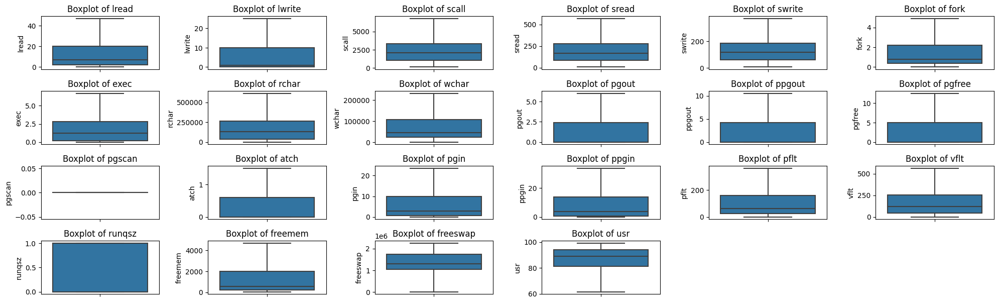

In [ ]:
plt.figure(figsize = (20,15))
feature_list = df.columns
for i in range(len(feature_list)):
    plt.subplot(10, 6, i + 1)
    sns.boxplot(y = df [feature_list[i]], data = df)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [ ]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,0.0,4659.125,1730946.0,95.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,1.0,4659.125,1869002.0,97.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,1.0,702.000,1021237.0,87.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,1.0,4659.125,1863704.0,98.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,1.0,633.000,1760253.0,90.0


In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
import math


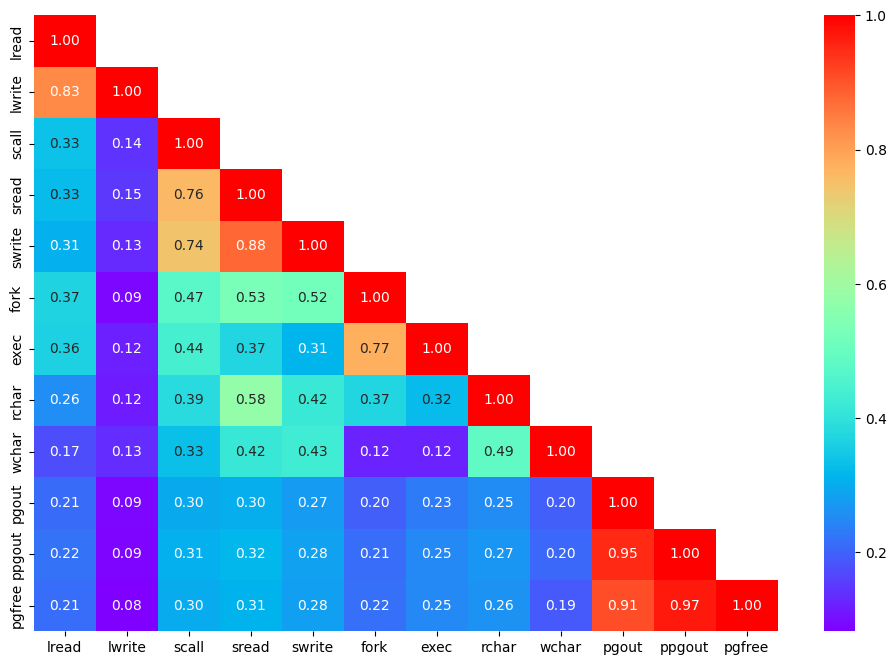

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(df.iloc[:,0:12].corr(),annot=True,fmt='.2f',cmap='rainbow',mask=np.triu(df.iloc[:,0:12].corr(),+1))
plt.show()

In [ ]:
df.shape

(8192, 22)

SPLIT DATA

In [ ]:
X = df.iloc[:,0:21]
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,0.0,1.6,2.6,16.00,26.40,0.0,4659.125,1730946.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,0.0,15.63,16.83,1.0,4659.125,1869002.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,0.0,1.2,6.0,9.4,150.20,220.20,1.0,702.000,1021237.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.0,0.2,0.2,15.60,16.80,1.0,4659.125,1863704.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,0.0,1.0,1.2,37.80,47.60,1.0,633.000,1760253.0


In [ ]:
Y = df['usr']
Y.head()

0    95.0
1    97.0
2    87.0
3    98.0
4    90.0
Name: usr, dtype: float64

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30 , random_state=1)

USING STATSMODEL OLS

In [ ]:
 #This adds the constant term beta0 to the Simple Linear Regression.
X_con=sm.add_constant(X)

In [ ]:
X_trainc, X_testc, y_trainc, y_testc = train_test_split(X_con, Y, test_size=0.30 , random_state=1)

Making linear model using ols

In [ ]:
model = sm.OLS(y_trainc,X_trainc).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1116.
Date:                Sun, 05 Nov 2023   Prob (F-statistic):               0.00
Time:                        05:20:10   Log-Likelihood:                -16656.
No. Observations:                5734   AIC:                         3.335e+04
Df Residuals:                    5713   BIC:                         3.349e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         84.1314      0.316    266.122      0.000      83.512      84.751
lread         -0.0634      0.009     -7.064      0.000      -0.081      -0.046
lwrite         0.0480      0.013      3.660      0.000       0.022       0.074
scall         -0.0007   6.28e-05    -10.576      0.000      -0.001      -0.001
sread          0.0003      0.001      0.336      0.737      -0.002       0.002
swrite        -0.0055      0.001     -3.805      0.000      -0.008      -0.003
fork           0.0296      0.132      0.225      0.822      -0.229       0.288
exec          -0.3211      0.052     -6.219      0.000      -0.422      -0.220
rchar      -5.212e-06   4.87e-07    -10.696      0.000   -6.17e-06   -4.26e-06
wchar      -5.346e-06   1.03e-06     -5.179      0.000   -7.37e-06   -3.32e-06
pgout         -0.3669      0.090     -4.077      0.000      -0.543      -0.190
ppgout        -0.0786      0.079     -0.999      0.318      -0.233       0.076
pgfree         0.0853      0.048      1.786      0.074      -0.008       0.179
pgscan      6.241e-15   3.76e-17    165.982      0.000    6.17e-15    6.31e-15
atch           0.6304      0.143      4.414      0.000       0.350       0.910
pgin           0.0198      0.028      0.695      0.487      -0.036       0.076
ppgin         -0.0672      0.020     -3.406      0.001      -0.106      -0.029
pflt          -0.0336      0.002    -16.954      0.000      -0.037      -0.030
vflt          -0.0055      0.001     -3.831      0.000      -0.008      -0.003
runqsz         1.6137      0.126     12.807      0.000       1.367       1.861
freemem       -0.0005   5.07e-05     -9.022      0.000      -0.001      -0.000
freeswap    8.829e-06    1.9e-07     46.463      0.000    8.46e-06     9.2e-06
==============================================================================
Omnibus:                     1102.551   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2367.549
Skew:                          -1.118   Prob(JB):                         0.00
Kurtosis:                       5.216   Cond. No.                     7.02e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.32e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

Get the value of coefficient of determination

In [ ]:
print('The variation in the independent variable which is explained by the dependent variable is',round(model.rsquared*100,4),'%')

The variation in the independent variable which is explained by the dependent variable is 79.6157 %


Get the prediction on test data

In [ ]:
ypred = model.predict(X_testc)
print(ypred)

3894    96.919640
4276    90.353086
3414    77.883855
4165    77.981118
7385    77.849229
          ...    
4744    98.357204
6918    81.226265
1556    97.585430
1577    90.923320
453     79.453566
Length: 2458, dtype: float64


Get the RMSE on training data

In [ ]:
print("The Root Mean Square Error (RMSE) of the model is for the training set is",mean_squared_error(model.fittedvalues,y_trainc,squared=False))

The Root Mean Square Error (RMSE) of the model is for the training set is 4.4190166755430935


In [ ]:
## Calculating the RMSE values with the code shown in the videos
math.sqrt(np.mean((model.predict(X_trainc)-y_trainc)**2))

4.4190166755430935

In [ ]:
model.predict(X_trainc)

694     91.520514
5535    91.786065
4244    74.869017
2472    80.738567
7052    98.273991
          ...    
7935    81.431567
5192    94.573274
3980    84.503959
235     84.162984
5157    92.963825
Length: 5734, dtype: float64

Get the RMSE on test set

In [ ]:
print("The Root Mean Square Error (RMSE) of the model is for testing set is",np.sqrt(mean_squared_error(y_test,ypred)))

The Root Mean Square Error (RMSE) of the model is for testing set is 4.652920160995275


Using Linear Model from Sci-kit learn library

Fit the model to the training set

In [ ]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

Get the score on training set

In [ ]:
print('The coefficient of determination R^2 of the prediction on Train set',regression_model.score(X_train, y_train))

The coefficient of determination R^2 of the prediction on Train set 0.7961565330395103


Get the score on test set

In [ ]:
print('The coefficient of determination R^2 of the prediction on Test set',regression_model.score(X_test, y_test))

The coefficient of determination R^2 of the prediction on Test set 0.7676695029858367


Get the RMSE on test set

In [ ]:
print("The Root Mean Square Error (RMSE) of the model is for testing set is",np.sqrt(mean_squared_error(y_test,regression_model.predict(X_test))))

The Root Mean Square Error (RMSE) of the model is for testing set is 4.652920160995946


Get the RMSE on train set

In [ ]:
print("The Root Mean Square Error (RMSE) of the model is for train set is",np.sqrt(mean_squared_error(y_train,regression_model.predict(X_train))))

The Root Mean Square Error (RMSE) of the model is for train set is 4.419016675543094


Check Multi-collinearity using VIF

In [ ]:
vif = [variance_inflation_factor(X.values, ix) for ix in range(X.shape[1])]

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


In [ ]:
i=0
for column in X.columns:
    if i < 15:
        print (column ,"--->",  vif[i])
        i = i+1

lread ---> 9.326562900259399
lwrite ---> 6.435149952798939
scall ---> 9.006255898359603
sread ---> 18.562678659324423
swrite ---> 16.862194869787487
fork ---> 24.981567255591003
exec ---> 5.916552039350398
rchar ---> 4.287093542695739
wchar ---> 3.393450625593844
pgout ---> 16.192842817459816
ppgout ---> 42.81334193258917
pgfree ---> 24.0386514399627
pgscan ---> nan
atch ---> 2.723143483602382
pgin ---> 23.066405205476794


In [69]:
olsmod_6 = sm.OLS(y_train, X_train).fit()
print(olsmod_6.summary())

                                 OLS Regression Results                                
Dep. Variable:                    usr   R-squared (uncentered):                   0.965
Model:                            OLS   Adj. R-squared (uncentered):              0.965
Method:                 Least Squares   F-statistic:                              7955.
Date:                Sun, 05 Nov 2023   Prob (F-statistic):                        0.00
Time:                        10:15:07   Log-Likelihood:                         -24096.
No. Observations:                5734   AIC:                                  4.823e+04
Df Residuals:                    5714   BIC:                                  4.837e+04
Df Model:                          20                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

Linearity and Independence of predictors

In [70]:
df_pred= pd.DataFrame()
df_pred["Actual_Values"] = y_train.values.flatten()
df_pred["Fitted_Values"] = olsmod_6.fittedvalues.values
df_pred["Residuals"] = olsmod_6.resid.values
df_pred.head()

,Actual_Values,Fitted_Values,Residuals
0,91.0,90.218731,0.781269
1,94.0,68.192655,25.807345
2,61.5,25.634824,35.865176
3,83.0,60.873109,22.126891
4,94.0,103.377800,-9.377800


<Axes: xlabel='Fitted_Values', ylabel='Residuals'>

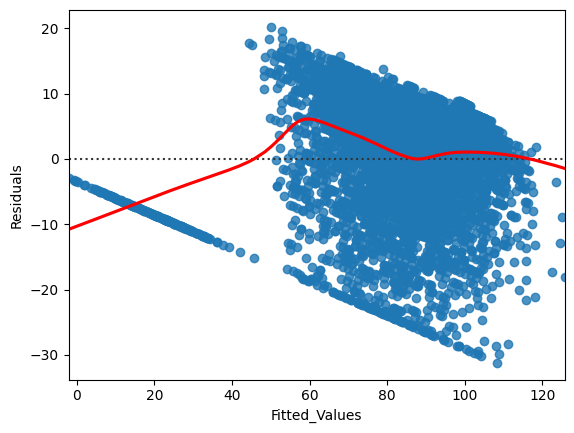

In [71]:
sns.residplot(data=df_pred,x="Fitted_Values",y="Residuals",lowess=True,line_kws=dict(color='r'))

Test for normality


In [72]:
import scipy.stats as stats
stats.shapiro(df_pred.Residuals)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9827542304992676, pvalue=7.319869921829714e-26)

test for homoscedacity

In [73]:
import statsmodels.stats.api as sms

In [74]:
sms.het_goldfeldquandt(df_pred.Residuals,X_train)

(1.0359446957478338, 0.1730922234889251, 'increasing')

In [76]:
# Let us write the equation of linear regression
Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train.columns)):
    if i == 0:
        print(olsmod_6.params[i], "+", end=" ")
    elif i != len(X_train.columns) - 1:
        print(
            olsmod_6.params[i],
            "* (",
            X_train.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(olsmod_6.params[i], "* (", X_train.columns[i], ")")

usr = 0.0405676330815176 + 0.18940457506323255 * ( lwrite ) +  0.0016996629317421739 * ( scall ) +  0.01062705578998727 * ( sread ) +  0.03120726140328898 * ( swrite ) +  -4.231812819055642 * ( fork ) +  1.0100421766330803 * ( exec ) +  3.4822544027262732e-06 * ( rchar ) +  2.1100167546548864e-05 * ( wchar ) +  1.187104251670321 * ( pgout ) +  -1.8389318151987566 * ( ppgout ) +  0.914582080869214 * ( pgfree ) +  -2.9836628921562222e-15 * ( pgscan ) +  4.06363294599411 * ( atch ) +  0.5787638692335303 * ( pgin ) +  -0.2512282171035673 * ( ppgin ) +  -0.06887191627623623 * ( pflt ) +  0.03828409162454253 * ( vflt ) +  13.436506742209744 * ( runqsz ) +  -0.0015677884113311758 * ( freemem ) +  4.98035940246531e-05 * ( freeswap )


PROJECT 2

In [25]:
import pandas as pd
from sklearn.linear_model import LogisticRegression

# importing ploting libraries
import matplotlib.pyplot as plt

#importing seaborn for statistical plots
import seaborn as sns

#Let us break the X and y dataframes into training set and test set. For this we will use
#Sklearn package's data splitting function which is based on random function

from sklearn.model_selection import train_test_split

import numpy as np


# calculate accuracy measures and confusion matrix
from sklearn import metrics

In [26]:
  from google.colab import drive
  drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [27]:
path_excel1="/content/drive/MyDrive/greatlearning/Contraceptive_method_dataset_new.xlsx"

In [28]:
cf=pd.read_excel(path_excel1)

In [29]:
cf.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [30]:
cf.tail()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,Yes


In [31]:
cf.shape

(1473, 10)

In [32]:
cf.info

<bound method DataFrame.info of       Wife_age Wife_ education Husband_education  No_of_children_born  \
0         24.0         Primary         Secondary                  3.0   
1         45.0      Uneducated         Secondary                 10.0   
2         43.0         Primary         Secondary                  7.0   
3         42.0       Secondary           Primary                  9.0   
4         36.0       Secondary         Secondary                  8.0   
...        ...             ...               ...                  ...   
1468      33.0        Tertiary          Tertiary                  NaN   
1469      33.0        Tertiary          Tertiary                  NaN   
1470      39.0       Secondary         Secondary                  NaN   
1471      33.0       Secondary         Secondary                  NaN   
1472      17.0       Secondary         Secondary                  1.0   

     Wife_religion Wife_Working  Husband_Occupation Standard_of_living_index  \
0      Scie

In [33]:
cf.describe()

,Wife_age,No_of_children_born,Husband_Occupation
count,1402.000000,1452.000000,1473.000000
mean,32.606277,3.254132,2.137814
std,8.274927,2.365212,0.864857
min,16.000000,0.000000,1.000000
25%,26.000000,1.000000,1.000000
50%,32.000000,3.000000,2.000000
75%,39.000000,4.000000,3.000000
max,49.000000,16.000000,4.000000


In [34]:
cf.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [35]:
cf.No_of_children_born=cf.No_of_children_born.fillna(cf.No_of_children_born.mean())

In [36]:
cf.Wife_age=cf.Wife_age .fillna(cf.Wife_age.mean())

In [37]:
cf.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [38]:
#Check for presence of duplicate rows
cf.duplicated().sum()

80

In [39]:
cf

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.000000,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.000000,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.000000,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.000000,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.000000,Scientology,No,3,Low,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1468,33.0,Tertiary,Tertiary,3.254132,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,3.254132,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,3.254132,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,3.254132,Scientology,Yes,2,Low,Exposed,Yes


In [40]:
cf.drop_duplicates()


,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.000000,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.000000,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.000000,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.000000,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.000000,Scientology,No,3,Low,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1468,33.0,Tertiary,Tertiary,3.254132,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,3.254132,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,3.254132,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,3.254132,Scientology,Yes,2,Low,Exposed,Yes


In [41]:
cf.shape

(1473, 10)

In [42]:
cf.duplicated()


0       False
1       False
2       False
3       False
4       False
        ...  
1468    False
1469    False
1470    False
1471    False
1472    False
Length: 1473, dtype: bool

In [43]:
cat=[]
num=[]
for i in cf.columns:
    if cf[i].dtype=="object":
        cat.append(i)
    else:
        num.append(i)
print(cat)
print(num)


['Wife_ education', 'Husband_education', 'Wife_religion', 'Wife_Working', 'Standard_of_living_index', 'Media_exposure ', 'Contraceptive_method_used']
['Wife_age', 'No_of_children_born', 'Husband_Occupation']


In [44]:
cf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


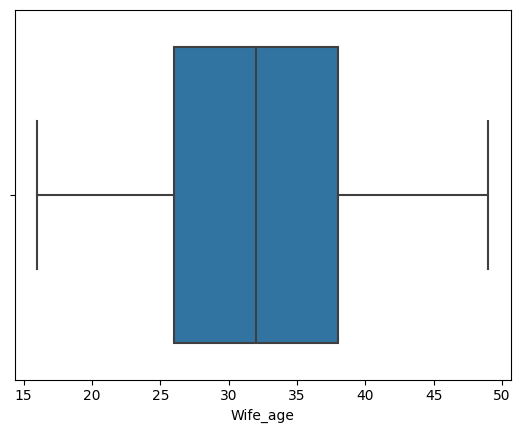

In [45]:
sns.boxplot(cf,x='Wife_age');

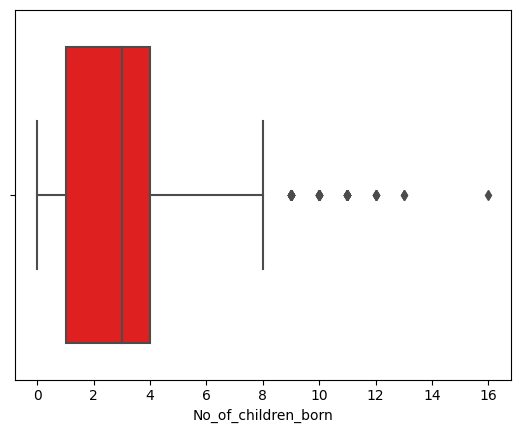

In [46]:
sns.boxplot(cf,x='No_of_children_born',color='red');

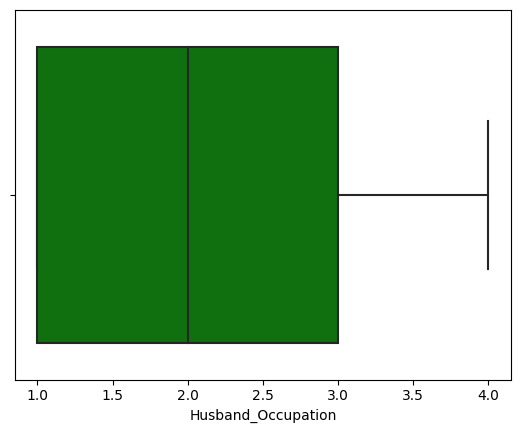

In [47]:
sns.boxplot(cf,x='Husband_Occupation',color='green');

In [48]:
for feature in cf.columns:
    if cf[feature].dtype == 'object':
        print('\n')
        print('feature:',feature)
        print(pd.Categorical(cf[feature].unique()))
        print(pd.Categorical(cf[feature].unique()).codes)
        cf[feature] = pd.Categorical(cf[feature]).codes



feature: Wife_ education
['Primary', 'Uneducated', 'Secondary', 'Tertiary']
Categories (4, object): ['Primary', 'Secondary', 'Tertiary', 'Uneducated']
[0 3 1 2]


feature: Husband_education
['Secondary', 'Primary', 'Tertiary', 'Uneducated']
Categories (4, object): ['Primary', 'Secondary', 'Tertiary', 'Uneducated']
[1 0 2 3]


feature: Wife_religion
['Scientology', 'Non-Scientology']
Categories (2, object): ['Non-Scientology', 'Scientology']
[1 0]


feature: Wife_Working
['No', 'Yes']
Categories (2, object): ['No', 'Yes']
[0 1]


feature: Standard_of_living_index
['High', 'Very High', 'Low', 'Very Low']
Categories (4, object): ['High', 'Low', 'Very High', 'Very Low']
[0 2 1 3]


feature: Media_exposure 
['Exposed', 'Not-Exposed']
Categories (2, object): ['Exposed', 'Not-Exposed']
[0 1]


feature: Contraceptive_method_used
['No', 'Yes']
Categories (2, object): ['No', 'Yes']
[0 1]


In [49]:
cf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_ education            1473 non-null   int8   
 2   Husband_education          1473 non-null   int8   
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   int8   
 5   Wife_Working               1473 non-null   int8   
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   int8   
 8   Media_exposure             1473 non-null   int8   
 9   Contraceptive_method_used  1473 non-null   int8   
dtypes: float64(2), int64(1), int8(7)
memory usage: 44.7 KB


In [50]:
cf.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,0,1,3.0,1,0,2,0,0,0
1,45.0,3,1,10.0,1,0,3,2,0,0
2,43.0,0,1,7.0,1,0,3,2,0,0
3,42.0,1,0,9.0,1,0,3,0,0,0
4,36.0,1,1,8.0,1,0,3,1,0,0


In [51]:
def remove_outliers(col):
  q1,q3=col.quantile([0.25,0.75])
  IQR=q3-q1
  LL=q1-(1.5*IQR)
  UL=q3+(1.5*IQR)
  return LL, UL

In [52]:
for i in cf.columns:
  LL,UL = remove_outliers(cf[i])
  cf[i]=np.where(cf[i]>UL, UL , cf[i])
  cf[i]=np.where(cf[i]<LL, LL , cf[i])

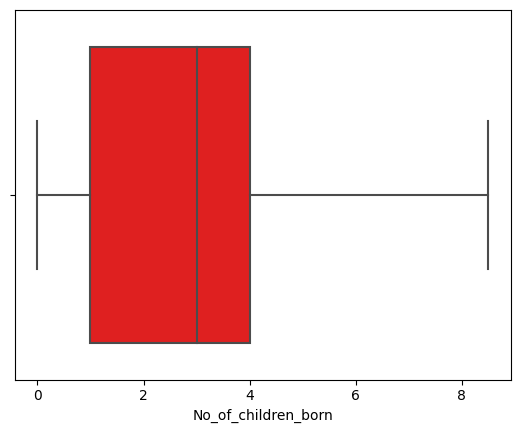

In [53]:
sns.boxplot(cf,x='No_of_children_born',color='red');

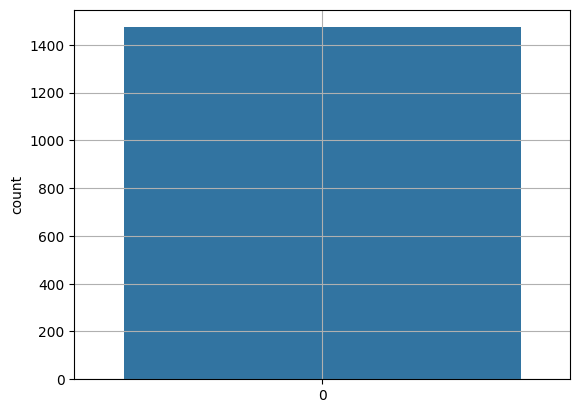

In [54]:
sns.countplot(cf.Contraceptive_method_used)
plt.grid()
plt.show()

In [55]:
cf.groupby(["Contraceptive_method_used"]).count()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure
Contraceptive_method_used,,,,,,,,,
0.0,629,629,629,629,629,629,629,629,629
1.0,844,844,844,844,844,844,844,844,844


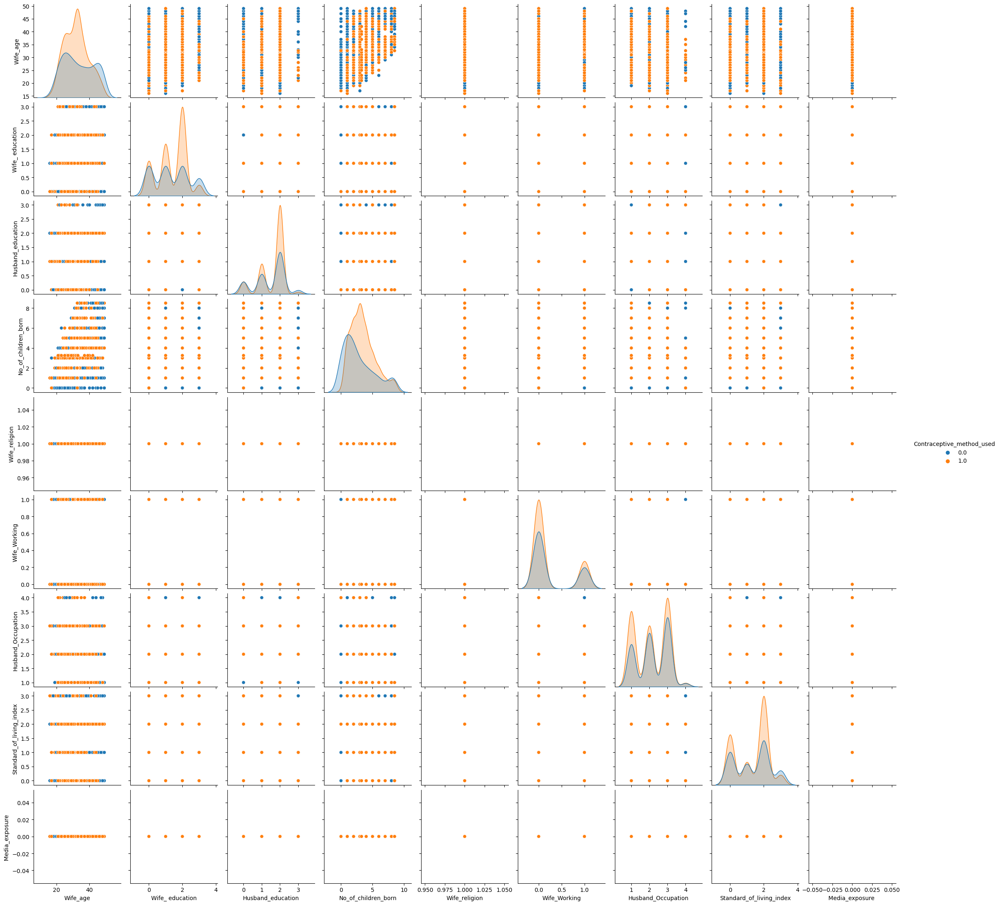

In [ ]:
# Pairplot using sns

sns.pairplot(cf , hue='Contraceptive_method_used' , diag_kind = 'kde');

Plot on bivariate analysis

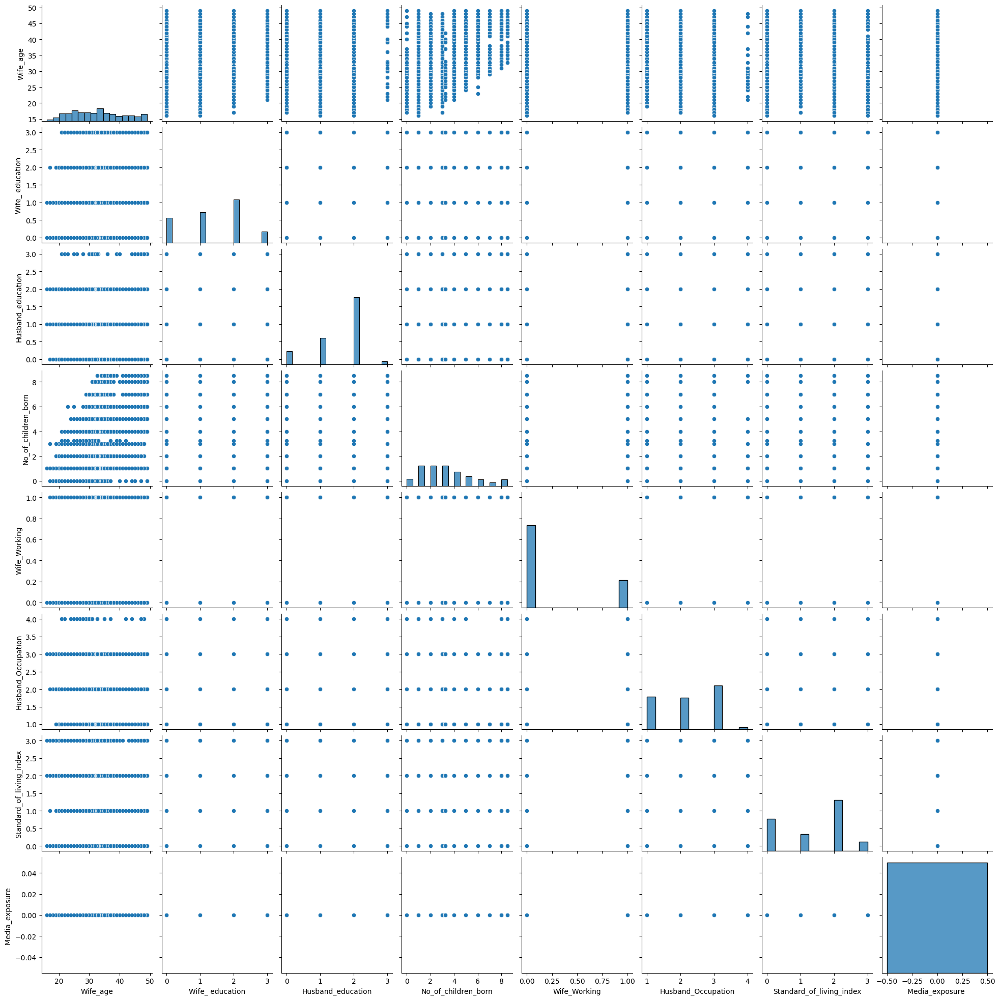

In [ ]:
sns.pairplot(cf)
plt.show()

In [56]:
#importing seaborn for statistical plots
import seaborn as sns

#Let us break the X and y dataframes into training set and test set. For this we will use
#Sklearn package's data splitting function which is based on random function

from sklearn.model_selection import train_test_split

import numpy as np


# calculate accuracy measures and confusion matrix
from sklearn import metrics

In [57]:
X = cf.drop('Contraceptive_method_used',axis=1)
Y = cf.Contraceptive_method_used
test_size = 0.30
seed = 7
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)

In [58]:
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

In [59]:
model_score = model.score(X_test, y_test)
print('Accuracy Score is ',model_score)

Accuracy Score is  0.6832579185520362


In [60]:
print('Confusion Matrix','\n',metrics.confusion_matrix(y_test, y_predict),'\n')
print('Classification Report','\n',metrics.classification_report(y_test, y_predict))

Confusion Matrix 
 [[ 81 108]
 [ 32 221]] 

Classification Report 
               precision    recall  f1-score   support

         0.0       0.72      0.43      0.54       189
         1.0       0.67      0.87      0.76       253

    accuracy                           0.68       442
   macro avg       0.69      0.65      0.65       442
weighted avg       0.69      0.68      0.66       442



In [61]:
model_score = model.score(X_train, y_train)
print('Accuracy Score is ',model_score)

Accuracy Score is  0.6508244422890398


In [ ]:

from sklearn.tree import DecisionTreeClassifier

In [ ]:
dt_model = DecisionTreeClassifier(criterion = 'gini' )

In [ ]:
# capture the target column ("default") into separate vectors for training set and test set

X = cf.drop("Contraceptive_method_used" , axis=1)

y = cf.pop("Contraceptive_method_used")

In [ ]:
# splitting data into training and test set for independent attributes
from sklearn.model_selection import train_test_split

X_train, X_test, train_labels, test_labels = train_test_split(X, y, test_size=.30, random_state=1)

In [ ]:
dt_model.fit(X_train, train_labels)

DecisionTreeClassifier()

In [ ]:
from sklearn import tree

train_char_label = ['No', 'Yes']
new_file_File = open('content\drive\MyDrive\haha\new_file.dot',mode='w')
dot_data = tree.export_graphviz(dt_model, out_file=new_file_File, feature_names = list(X_train), class_names = list(train_char_label))

new_file_File.close()

In [ ]:
# importance of features in the tree building ( The importance of a feature is computed as the
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                               Imp
Wife_age                  0.347470
Wife_ education           0.109216
Husband_education         0.076432
No_of_children_born       0.246126
Wife_religion             0.000000
Wife_Working              0.069886
Husband_Occupation        0.078468
Standard_of_living_index  0.072401
Media_exposure            0.000000


Regularised the decision tree

In [ ]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 7,min_samples_leaf=10,min_samples_split=30)
reg_dt_model.fit(X_train, train_labels)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=10, min_samples_split=30)

In [ ]:
credit_tree_regularized = open('d:\credit_tree_regularized.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= credit_tree_regularized , feature_names = list(X_train), class_names = list(train_char_label))

credit_tree_regularized.close()

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                               Imp
Wife_age                  0.347470
Wife_ education           0.109216
Husband_education         0.076432
No_of_children_born       0.246126
Wife_religion             0.000000
Wife_Working              0.069886
Husband_Occupation        0.078468
Standard_of_living_index  0.072401
Media_exposure            0.000000


In [ ]:
ytrain_predict = reg_dt_model.predict(X_train)
ytest_predict = reg_dt_model.predict(X_test)

AUC: 0.794


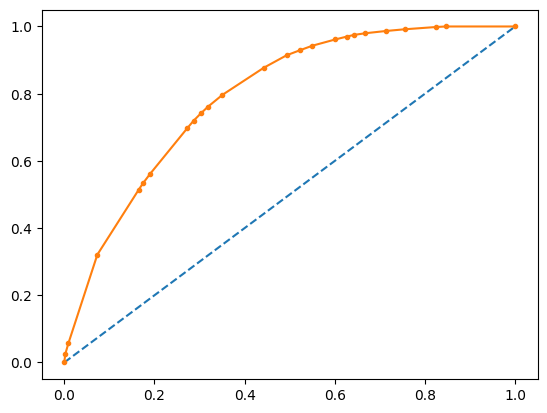

In [ ]:
# AUC and ROC for the training data

# predict probabilities
probs = reg_dt_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(train_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(train_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

AUC: 0.736


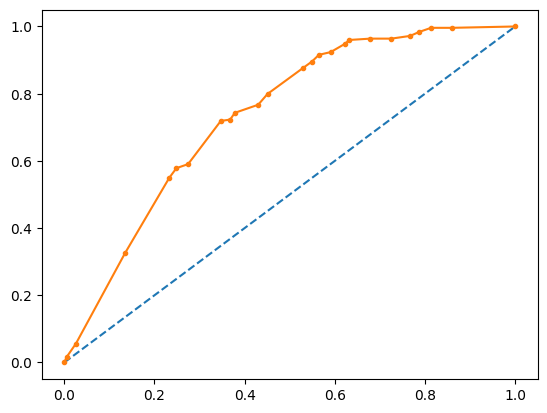

In [ ]:
# AUC and ROC for the test data


# predict probabilities
probs = reg_dt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(test_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(test_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix

In [ ]:
print(classification_report(train_labels, ytrain_predict))

              precision    recall  f1-score   support

         0.0       0.77      0.56      0.65       436
         1.0       0.73      0.88      0.80       595

    accuracy                           0.74      1031
   macro avg       0.75      0.72      0.72      1031
weighted avg       0.75      0.74      0.73      1031



In [ ]:
print(classification_report(test_labels, ytest_predict))

              precision    recall  f1-score   support

         0.0       0.75      0.47      0.58       193
         1.0       0.68      0.88      0.77       249

    accuracy                           0.70       442
   macro avg       0.71      0.67      0.67       442
weighted avg       0.71      0.70      0.68       442



In [ ]:
confusion_matrix(train_labels, ytrain_predict)

array([[243, 193],
       [ 73, 522]])

In [ ]:
confusion_matrix(test_labels, ytest_predict)

array([[ 91, 102],
       [ 31, 218]])

In [ ]:
reg_dt_model.score(X_train,train_labels)

0.7419980601357905

In [ ]:
reg_dt_model.score(X_test,test_labels)

0.6990950226244343

CART

In [ ]:
predictions = dtree.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,roc_auc_score,roc_curve

In [ ]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.56      0.58      0.57       181
         1.0       0.67      0.65      0.66       237

    accuracy                           0.62       418
   macro avg       0.62      0.62      0.62       418
weighted avg       0.62      0.62      0.62       418



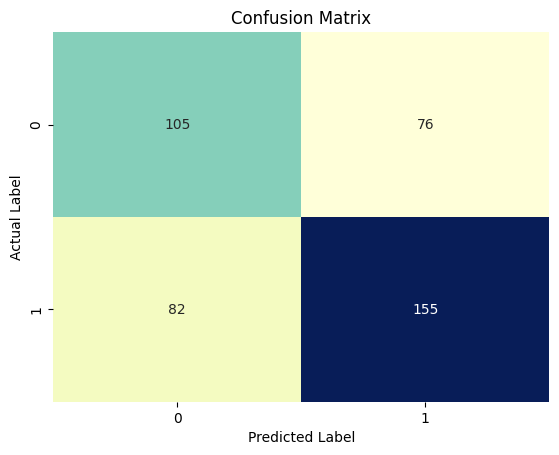

In [ ]:
sns.heatmap(confusion_matrix(y_test,predictions),annot=True, fmt='d', cbar=False,cmap='YlGnBu')
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
print('Accuracy Score is',round(accuracy_score(y_test, predictions),2)*100,'%')

Accuracy Score is 62.0 %


In [ ]:
print('Area Under the Curve is',round(roc_auc_score(y_test,dtree.predict_proba(X_test)[:,1]),2)*100,'%')

Area Under the Curve is 63.0 %


In [ ]:
dt_fpr, dt_tpr,_=roc_curve(y_test,dtree.predict_proba(X_test)[:,1])

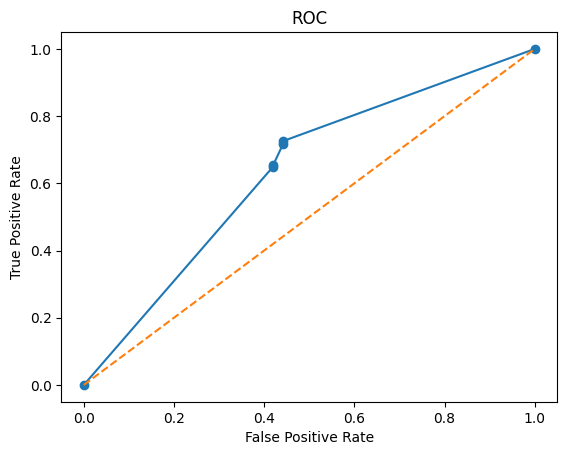

In [ ]:
plt.plot(dt_fpr,dt_tpr, marker='o', label='Decision Tree')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()

In [ ]:
dt_model = DecisionTreeClassifier(criterion = 'gini' )

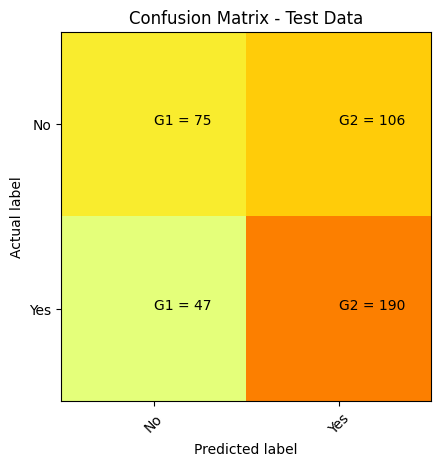

In [ ]:
cm = metrics.confusion_matrix(y_test, y_predict)
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['No', 'Yes']
plt.title('Confusion Matrix - Test Data')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['G1', 'G2'], ['G1','G2']]

for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score,roc_curve

AUC: 0.640


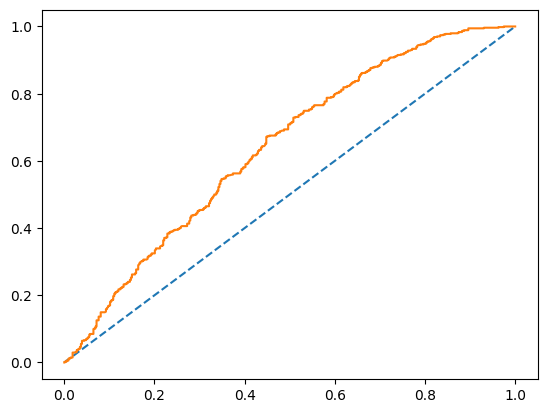

In [ ]:
probs = model.predict_proba(X_train)
probs = probs[:, 1]

auc=roc_auc_score(y_train, probs)
print('AUC: %.3f' %auc)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0,1], [0,1] , linestyle='--')
plt.plot(train_fpr, train_tpr)

AUC: 0.612


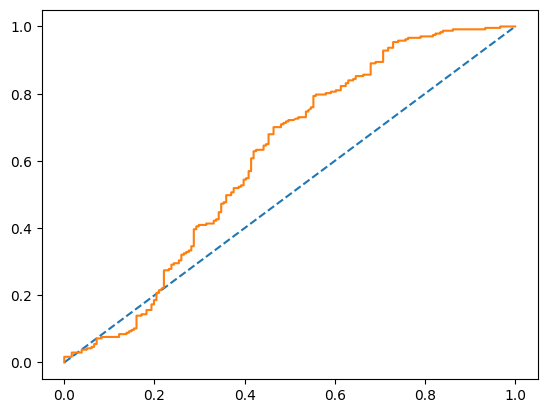

In [ ]:
probs = model.predict_proba(X_test)
probs = probs[:, 1]

auc=roc_auc_score(y_test, probs)
print('AUC: %.3f' %auc)

test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0,1], [0,1] , linestyle='--')
plt.plot(test_fpr, test_tpr)

In [ ]:
cf.iloc[:,0:11].corr()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
Wife_age,1.000000,0.209403,0.043933,0.532025,NaN,0.034207,-0.199495,0.046264,NaN,-0.087526
Wife_ education,0.209403,1.000000,0.220614,0.006141,NaN,0.046367,-0.212173,0.040663,NaN,0.041501
Husband_education,0.043933,0.220614,1.000000,-0.127322,NaN,0.023975,-0.282421,0.014156,NaN,0.082352
No_of_children_born,0.532025,0.006141,-0.127322,1.000000,NaN,-0.101371,-0.017999,-0.005624,NaN,0.132568
Wife_religion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,0.034207,0.046367,0.023975,-0.101371,NaN,1.000000,-0.014232,0.012601,NaN,-0.039370
Husband_Occupation,-0.199495,-0.212173,-0.282421,-0.017999,NaN,-0.014232,1.000000,-0.070682,NaN,-0.062412
Standard_of_living_index,0.046264,0.040663,0.014156,-0.005624,NaN,0.012601,-0.070682,1.000000,NaN,-0.008003
Media_exposure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,-0.087526,0.041501,0.082352,0.132568,NaN,-0.039370,-0.062412,-0.008003,NaN,1.000000


In [ ]:
cf = pd.get_dummies(cf,drop_first=True)
cf.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,0.0,1.0,3.0,1.0,0.0,2.0,0.0,0.0,0.0
1,45.0,3.0,1.0,8.5,1.0,0.0,3.0,2.0,0.0,0.0
2,43.0,0.0,1.0,7.0,1.0,0.0,3.0,2.0,0.0,0.0
3,42.0,1.0,0.0,8.5,1.0,0.0,3.0,0.0,0.0,0.0
4,36.0,1.0,1.0,8.0,1.0,0.0,3.0,1.0,0.0,0.0


In [ ]:
cf.iloc[:,0:11].corr()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
Wife_age,1.000000,0.209403,0.043933,0.532025,NaN,0.034207,-0.199495,0.046264,NaN,-0.087526
Wife_ education,0.209403,1.000000,0.220614,0.006141,NaN,0.046367,-0.212173,0.040663,NaN,0.041501
Husband_education,0.043933,0.220614,1.000000,-0.127322,NaN,0.023975,-0.282421,0.014156,NaN,0.082352
No_of_children_born,0.532025,0.006141,-0.127322,1.000000,NaN,-0.101371,-0.017999,-0.005624,NaN,0.132568
Wife_religion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,0.034207,0.046367,0.023975,-0.101371,NaN,1.000000,-0.014232,0.012601,NaN,-0.039370
Husband_Occupation,-0.199495,-0.212173,-0.282421,-0.017999,NaN,-0.014232,1.000000,-0.070682,NaN,-0.062412
Standard_of_living_index,0.046264,0.040663,0.014156,-0.005624,NaN,0.012601,-0.070682,1.000000,NaN,-0.008003
Media_exposure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,-0.087526,0.041501,0.082352,0.132568,NaN,-0.039370,-0.062412,-0.008003,NaN,1.000000


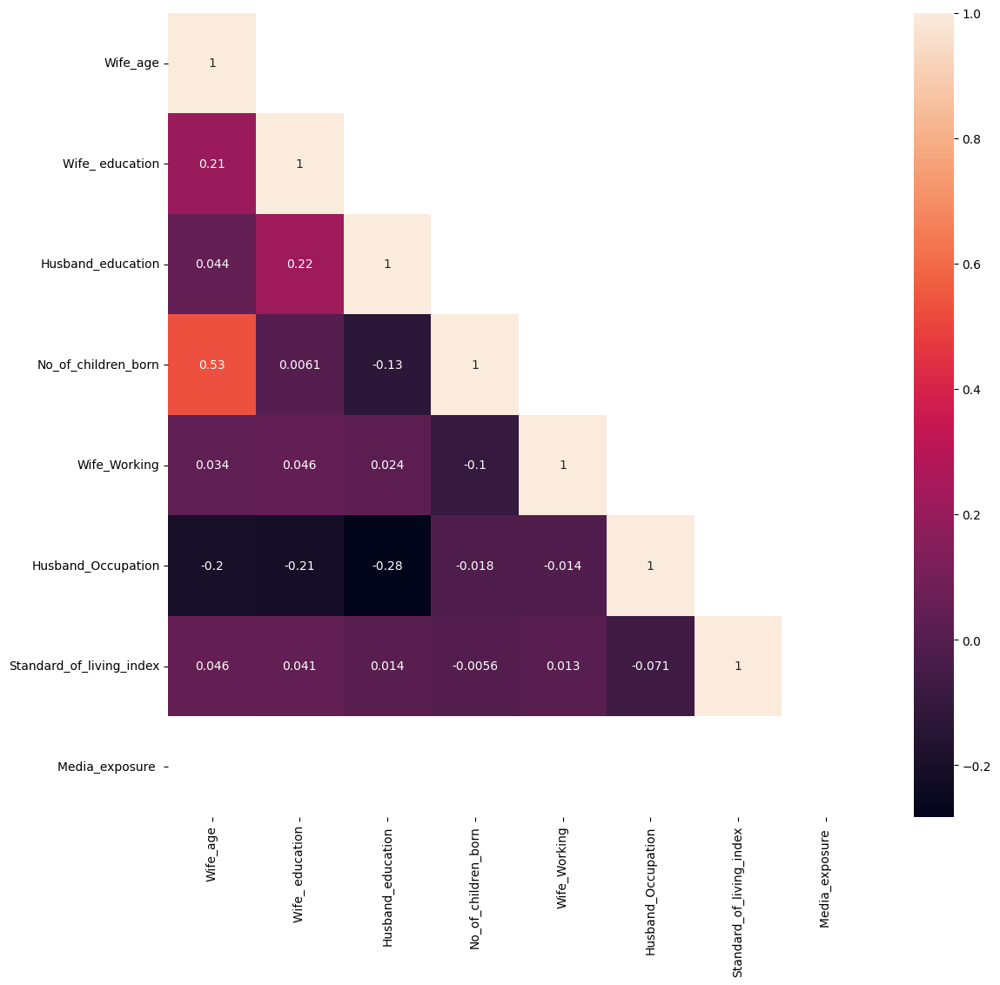

In [ ]:
plt.figure(figsize =(13,12))
fig = sns.heatmap(cf.iloc[:,0:12].corr(),annot=True,cbar=True,mask=np.triu(cf.iloc[:,0:12].corr(),+1))
plt.show()

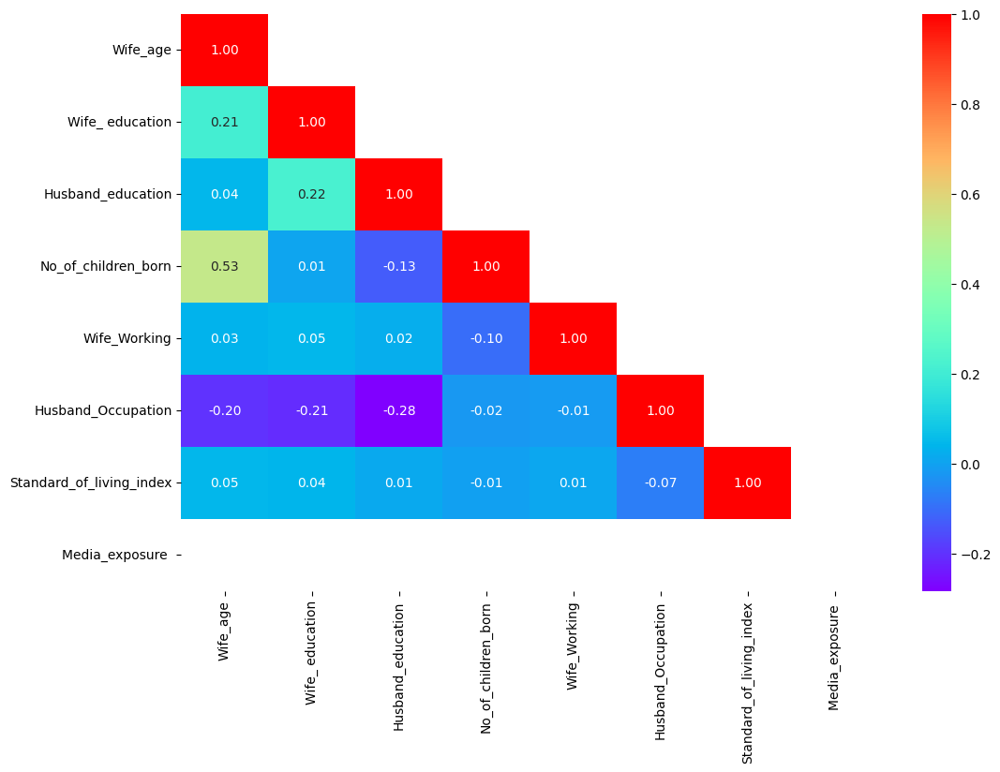

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(cf.iloc[:,0:12].corr(),annot=True,fmt='.2f',cmap='rainbow',mask=np.triu(cf.iloc[:,0:12].corr(),+1))
plt.show()